In [0]:
from __future__ import print_function

import os
import json
import shutil
import numpy as np

from utils import prepare_data

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Using TensorFlow backend.


In [0]:
sns.set(style="whitegrid", font_scale=1.3)

In [0]:
matplotlib.rcParams["legend.framealpha"] = 1
matplotlib.rcParams["legend.frameon"] = True

# Data

In [0]:
data_path = "../data"
valid_size = 0.2
FORCED_DATA_REWRITE = True

In [0]:
train_path, valid_path = prepare_data(data_path=data_path, 
                                      valid_size=valid_size, 
                                      FORCED_DATA_REWRITE=FORCED_DATA_REWRITE)

In [0]:
train_neg_path = os.path.join(train_path, "Negative")
train_pos_path = os.path.join(train_path, "Positive")
valid_neg_path = os.path.join(valid_path, "Negative")
valid_pos_path = os.path.join(valid_path, "Positive")

In [0]:
n_examples = 5

In [0]:
np.random.seed(42)
positive_expamples = np.random.choice(os.listdir(train_pos_path), size=n_examples, replace=False)
negative_expamples = np.random.choice(os.listdir(train_neg_path), size=n_examples, replace=False)

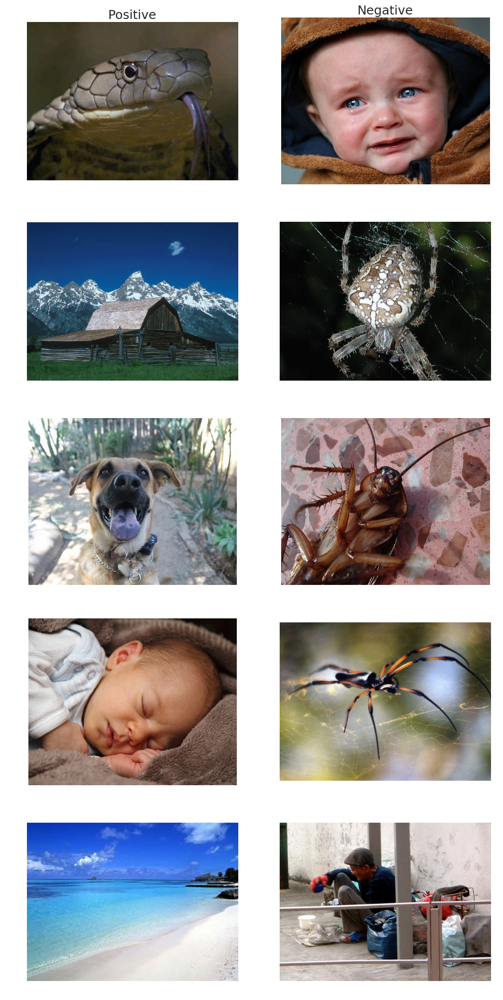

In [0]:
plt.figure(figsize=(12, n_examples * 5))
for i in range(n_examples):
    plt.subplot(n_examples, 2, i * 2 + 1)
    img = load_img(os.path.join(train_pos_path, positive_expamples[i]))
    plt.imshow(img)
    plt.axis("off")
    if i == 0:
        plt.title("Positive", fontsize=18)
    plt.subplot(n_examples, 2, i * 2 + 2)
    img = load_img(os.path.join(train_neg_path, negative_expamples[i]))
    plt.imshow(img)
    plt.axis("off")
    if i == 0:
        plt.title("Negative", fontsize=18)

In [0]:
img_height, img_width = 400, 500

# Preprocessing

In [0]:
def compare_images(img1, img2):
    if type(img1) == np.ndarray:
        img1 = array_to_img(img1)
    if type(img2) == np.ndarray:
        img2 = array_to_img(img2)
    plt.figure(figsize=(14, 6))
    plt.subplot(121)
    plt.imshow(img1)
    plt.axis("off")
    plt.title("Original", fontsize=18)
    plt.subplot(122)
    plt.imshow(img2)
    plt.axis("off")
    plt.title("Transformed", fontsize=18)

## Cleaning transformations

### Rescaling

In [0]:
datagen_rescaled = ImageDataGenerator(rescale=1. / 255.)
datagen_default = ImageDataGenerator()

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_rescaled = datagen_rescaled.flow_from_directory(train_path, 
                                                    target_size=(img_height, img_width), 
                                                    batch_size=1, 
                                                    shuffle=False, 
                                                    class_mode=None)

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


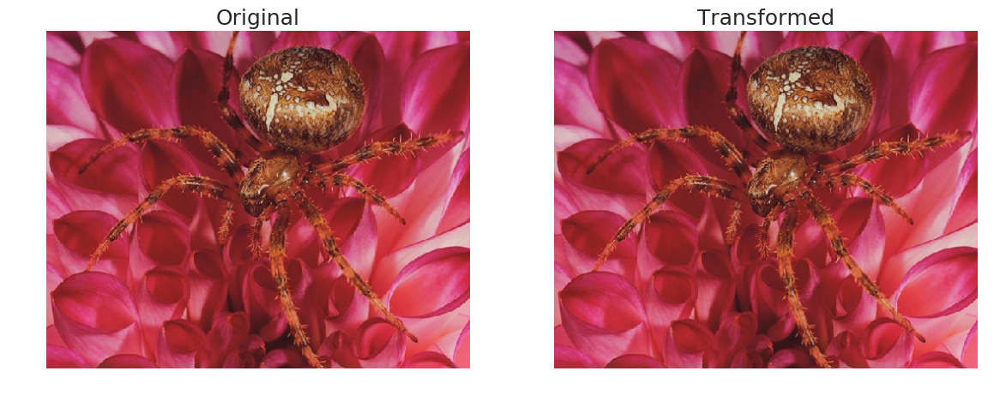

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_rescaled = next(gen_rescaled)
compare_images(sample_default[0], sample_rescaled[0])

In [0]:
sample_default[0][:2, :2, 0]

array([[ 143.,  144.],
       [ 144.,  144.]], dtype=float32)

In [0]:
sample_rescaled[0][:2, :2, 0]

array([[ 0.56078434,  0.56470591],
       [ 0.56470591,  0.56470591]], dtype=float32)

### Grayscaling

In [0]:
datagen_default = ImageDataGenerator()

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_grayscaled = datagen_default.flow_from_directory(train_path, 
                                                     target_size=(img_height, img_width), 
                                                     batch_size=1, 
                                                     shuffle=False, 
                                                     class_mode=None, 
                                                     color_mode="grayscale")

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


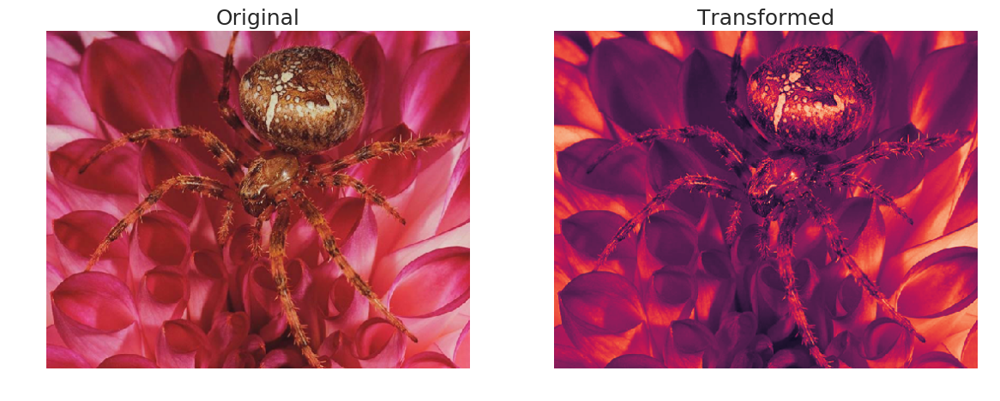

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_grayscaled = next(gen_grayscaled)
compare_images(sample_default[0], sample_grayscaled[0])

### Samplewise centering (across features inside one sample)

In [0]:
datagen_samplewise_mean = ImageDataGenerator(samplewise_center=True)
datagen_default = ImageDataGenerator()

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_samplewise_mean = datagen_samplewise_mean.flow_from_directory(train_path, 
                                                                  target_size=(img_height, img_width), 
                                                                  batch_size=1, 
                                                                  shuffle=False,  
                                                                  class_mode=None)

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


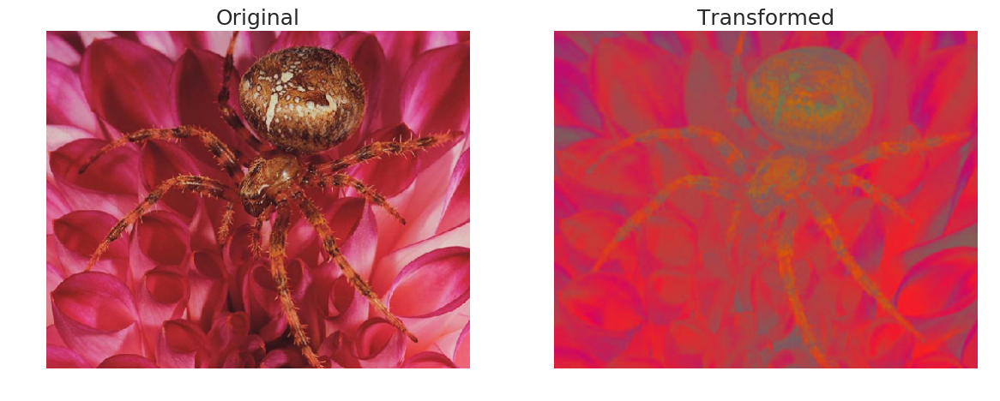

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_samplewise_mean = next(gen_samplewise_mean)
compare_images(sample_default[0], sample_samplewise_mean[0])

### Samplewise std normalization (across features inside one sample)

In [0]:
datagen_samplewise_std = ImageDataGenerator(samplewise_std_normalization=True)
datagen_default = ImageDataGenerator()

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_samplewise_std = datagen_samplewise_std.flow_from_directory(train_path, 
                                                                target_size=(img_height, img_width), 
                                                                batch_size=1, 
                                                                shuffle=False, 
                                                                class_mode=None)

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


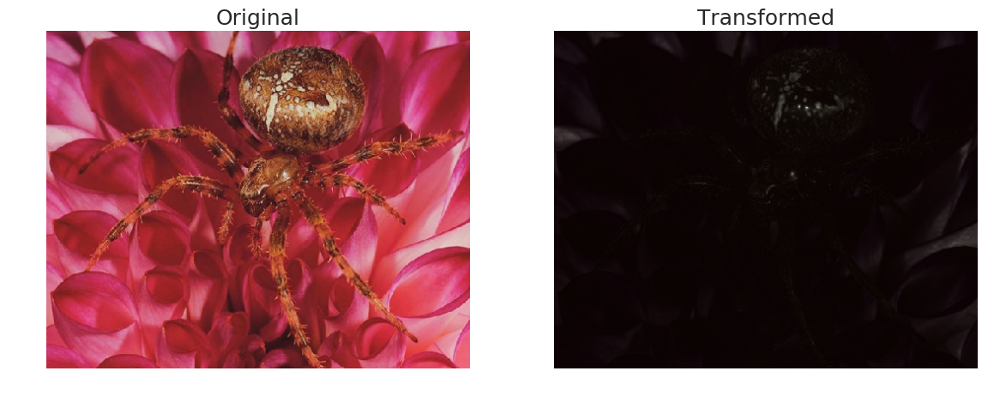

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_samplewise_std = next(gen_samplewise_std)
compare_images(sample_default[0], sample_samplewise_std[0])

### Featurewise centering (across samples in dataset)

In [0]:
datagen_default = ImageDataGenerator()

In [0]:
gen_dataset = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_dataset = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  shuffle=False, 
                                                  batch_size=gen_dataset.n, 
                                                  class_mode=None)

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


In [0]:
dataset = next(gen_dataset)
dataset.shape

(1305, 400, 500, 3)

In [0]:
mean_image = dataset.mean(axis=0)

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)

Found 1305 images belonging to 2 classes.


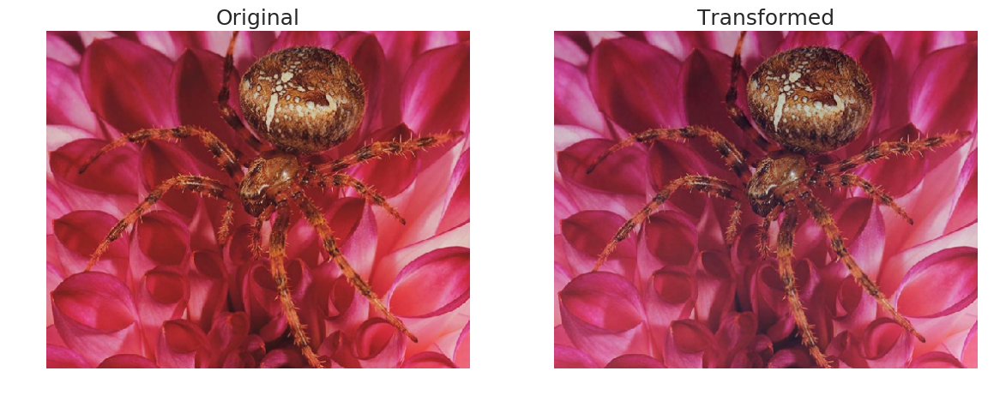

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_featurewise_mean = sample_default - mean_image
compare_images(sample_default[0], sample_featurewise_mean[0])

### Featurewise std normalization (across samples in dataset)

In [0]:
datagen_default = ImageDataGenerator()

In [0]:
gen_dataset = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_dataset = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  shuffle=False, 
                                                  batch_size=gen_dataset.n, 
                                                  class_mode=None)

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


In [0]:
dataset = next(gen_dataset)
dataset.shape

(1305, 400, 500, 3)

In [0]:
std_image = dataset.std(axis=0)

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)

Found 1305 images belonging to 2 classes.


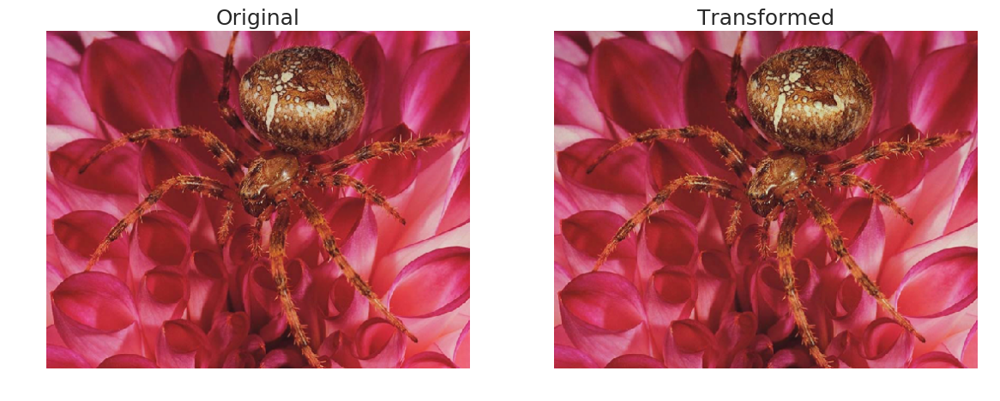

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_featurewise_std = sample_default / std_image
compare_images(sample_default[0], sample_featurewise_std[0])

## Augmentation transformations

### Rotation

In [0]:
datagen_rotated = ImageDataGenerator(rotation_range=45, fill_mode="constant")
datagen_default = ImageDataGenerator()

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_rotated = datagen_rotated.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


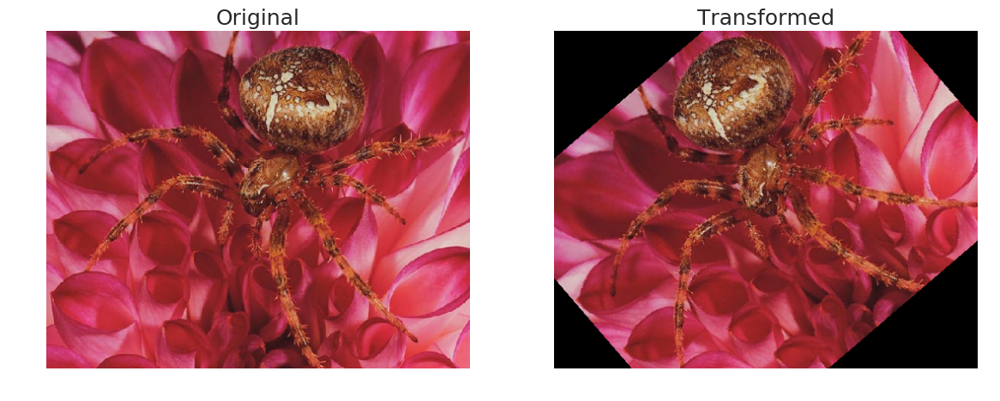

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_rotated = next(gen_rotated)
compare_images(sample_default[0], sample_rotated[0])

### Horizontal shift

In [0]:
datagen_hshifted = ImageDataGenerator(width_shift_range=0.4, fill_mode="constant")
datagen_default = ImageDataGenerator()

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_hshifted = datagen_hshifted.flow_from_directory(train_path, 
                                                    target_size=(img_height, img_width), 
                                                    batch_size=1, 
                                                    shuffle=False, 
                                                    class_mode=None)

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


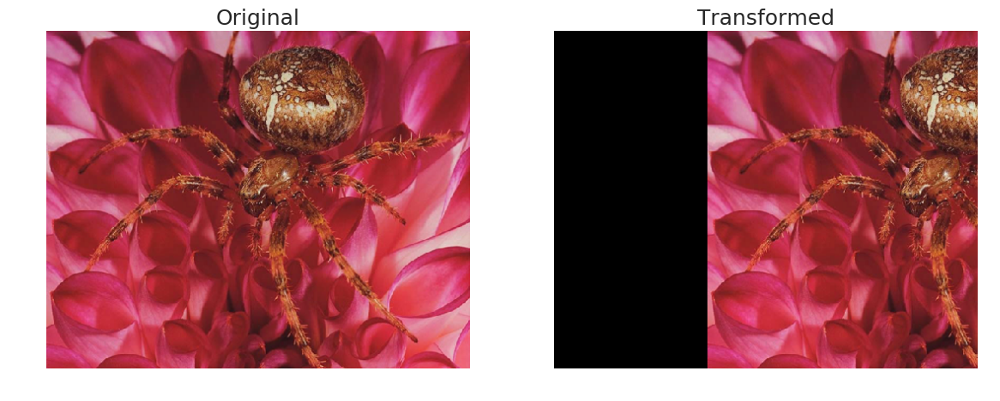

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_hshifted = next(gen_hshifted)
compare_images(sample_default[0], sample_hshifted[0])

### Vertical shift

In [0]:
datagen_vshifted = ImageDataGenerator(height_shift_range=0.4, fill_mode="constant")
datagen_default = ImageDataGenerator()

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_vshifted = datagen_vshifted.flow_from_directory(train_path, 
                                                    target_size=(img_height, img_width), 
                                                    batch_size=1, 
                                                    shuffle=False, 
                                                    class_mode=None)

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


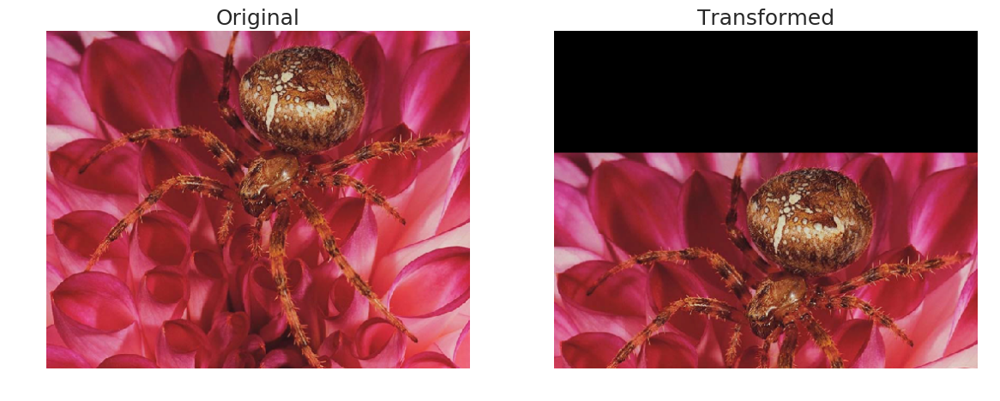

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_vshifted = next(gen_vshifted)
compare_images(sample_default[0], sample_vshifted[0])

### Shearing

In [0]:
datagen_sheared = ImageDataGenerator(shear_range=0.75, fill_mode="constant")
datagen_default = ImageDataGenerator()

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_sheared = datagen_sheared.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


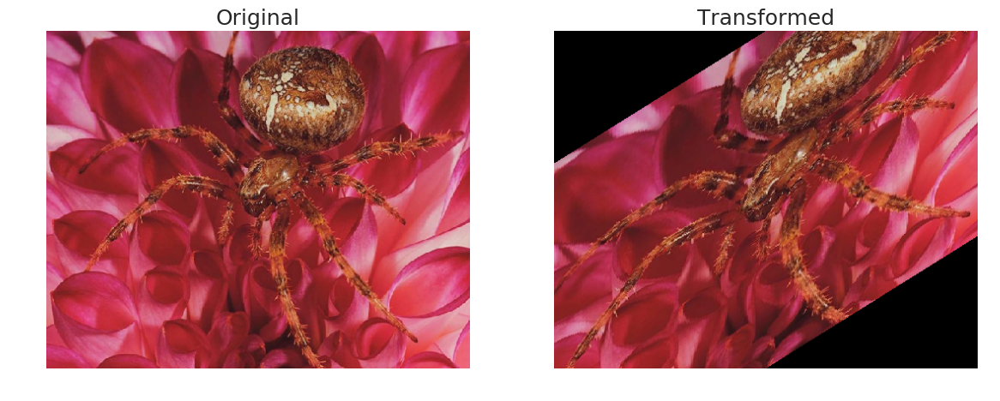

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_sheared = next(gen_sheared)
compare_images(sample_default[0], sample_sheared[0])

### Zoom

In [0]:
datagen_zoomed = ImageDataGenerator(zoom_range=0.5, fill_mode="constant")
datagen_default = ImageDataGenerator()

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_zoomed = datagen_zoomed.flow_from_directory(train_path, 
                                                target_size=(img_height, img_width), 
                                                batch_size=1, 
                                                shuffle=False, 
                                                class_mode=None)

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


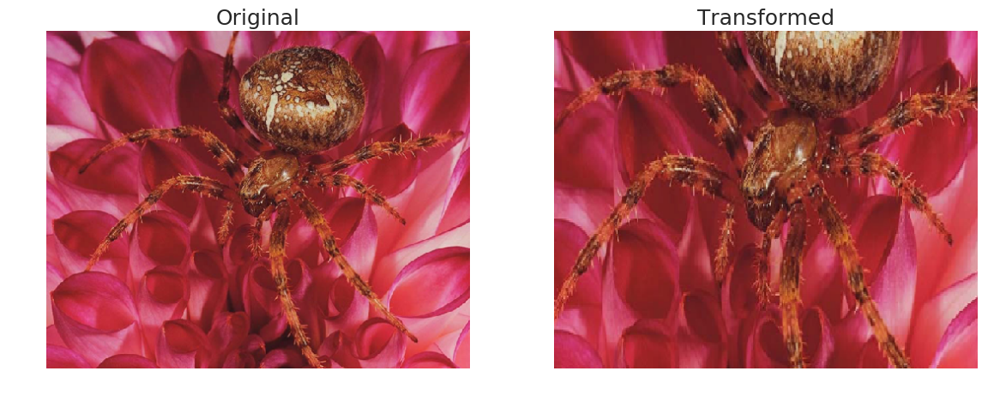

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_zoomed = next(gen_zoomed)
compare_images(sample_default[0], sample_zoomed[0])

### Horizontal flip

In [0]:
datagen_hflipped = ImageDataGenerator(horizontal_flip=True)
datagen_default = ImageDataGenerator()

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_hflipped = datagen_hflipped.flow_from_directory(train_path, 
                                                    target_size=(img_height, img_width), 
                                                    batch_size=1, 
                                                    shuffle=False, 
                                                    class_mode=None)

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


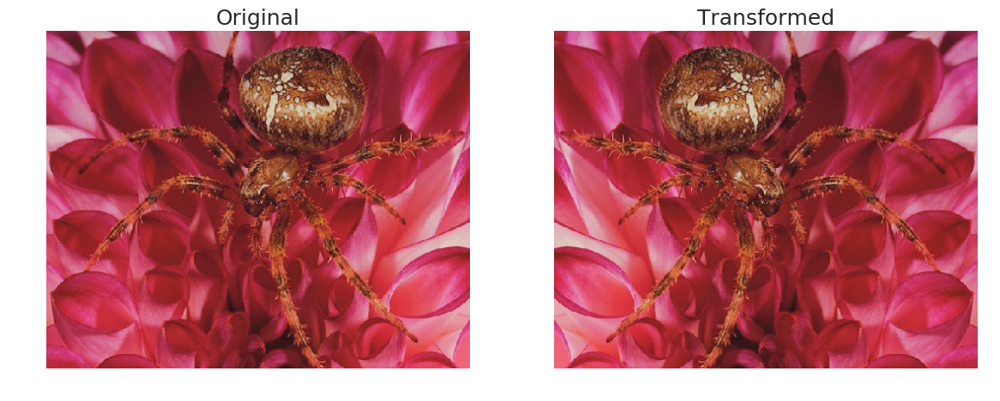

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_hflipped = next(gen_hflipped)
compare_images(sample_default[0], sample_hflipped[0])

### Vertical flip

In [0]:
datagen_vflipped = ImageDataGenerator(vertical_flip=True)
datagen_default = ImageDataGenerator()

In [0]:
gen_default = datagen_default.flow_from_directory(train_path, 
                                                  target_size=(img_height, img_width), 
                                                  batch_size=1, 
                                                  shuffle=False, 
                                                  class_mode=None)
gen_vflipped = datagen_vflipped.flow_from_directory(train_path, 
                                                    target_size=(img_height, img_width), 
                                                    batch_size=1, 
                                                    shuffle=False, 
                                                    class_mode=None)

Found 1305 images belonging to 2 classes.
Found 1305 images belonging to 2 classes.


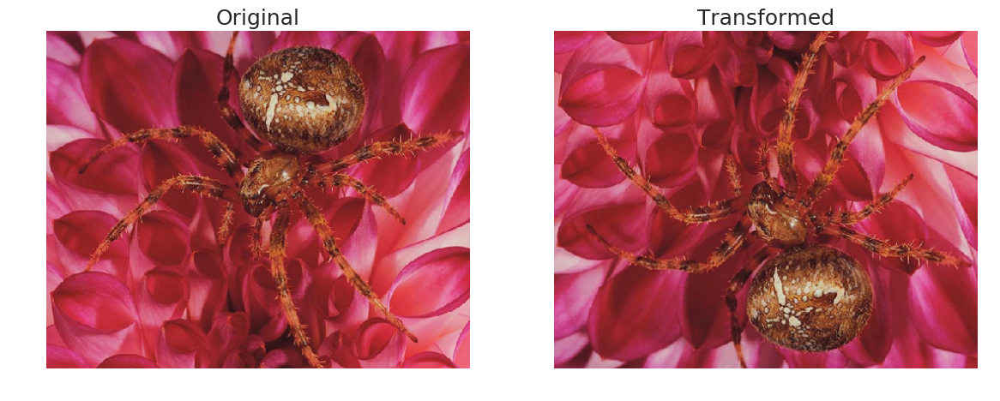

In [0]:
np.random.seed(21)
sample_default = next(gen_default)
sample_vflipped = next(gen_vflipped)
compare_images(sample_default[0], sample_vflipped[0])

## Combination

In [0]:
datagen = ImageDataGenerator(rotation_range=45, 
                             width_shift_range=0.2, 
                             height_shift_range=0.2, 
                             shear_range=0.2, 
                             zoom_range=0.3, 
                             horizontal_flip=True, 
                             vertical_flip=True, 
                             fill_mode="nearest")

In [0]:
try:
    img = load_img(os.path.join(train_pos_path, "Firehydrant2.jpg"))
except:
    img = load_img(os.path.join(valid_pos_path, "Firehydrant2.jpg"))

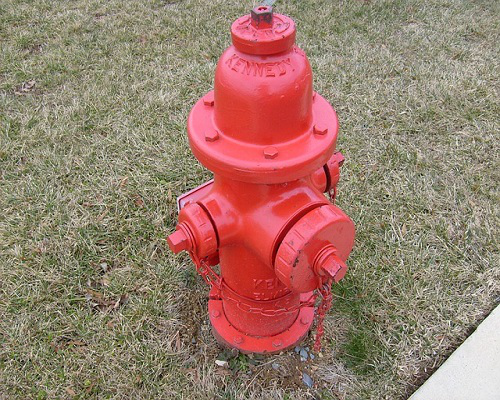

In [0]:
img

In [0]:
img = img_to_array(img)
img = img.reshape((1,) + img.shape)

In [0]:
n_augmentations = 8

In [0]:
save_dir = os.path.join(data_path, "augmentation_preview")
if os.path.exists(save_dir):
    shutil.rmtree(save_dir)
os.mkdir(save_dir)

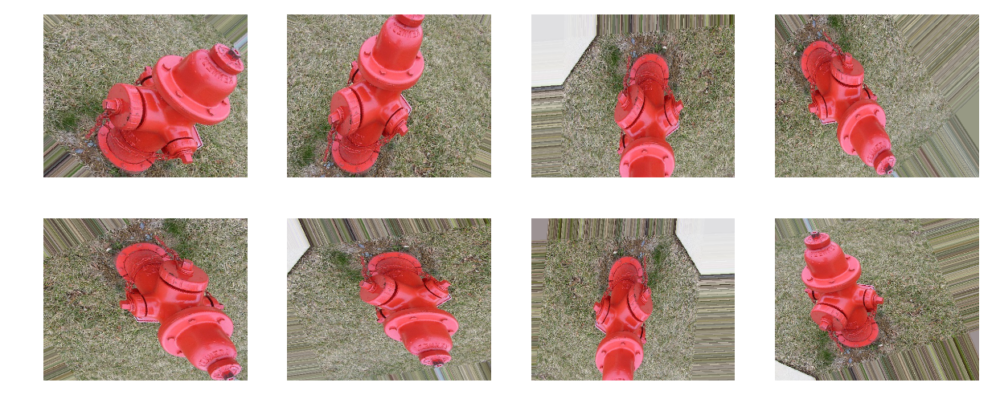

In [0]:
plt.figure(figsize=(15, 6))    
i = 0

for batch in datagen.flow(img, 
                          batch_size=1, 
                          seed=21, 
                          save_to_dir=save_dir, 
                          save_prefix="hydrant", 
                          save_format="jpeg"):
    
    plt.subplot(2, int(np.ceil(n_augmentations * 1. / 2)), i + 1)
    plt.imshow(array_to_img(batch[0]))
    plt.axis("off")
    
    i += 1
    if i >= n_augmentations:
        break